# Installs & Imports

In [9]:
!pip install -q yfinance

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yfinance as yf
from numpy.random import rand, seed

# Configurations & Parameters

In [11]:
# Stock ticker symbol
TICKER = "TSLA"

# Date range for historical data
START_DATE = "2017-01-01"
END_DATE = "2023-12-31"

# Initial investment parameters
INIT_CASH = 50000          # Starting capital
MIN_WEALTH = INIT_CASH * 0.5   # 50% loss threshold
MAX_WEALTH = INIT_CASH * 2     # 100% profit threshold

# Financial parameters
PENALTY = 1.25             # Penalty multiplier for negative cash
COST = 0.25                # Transaction cost per share

# Q-learning parameters
GAMMA = 0.9975             # Discount factor
SIGMA = 2                  # Risk aversion parameter (CRRA)
ALPHA = 0.4                # Learning rate
EPISODES = 16000           # Total training episodes
EPISODE_SPLIT = 9000       # Episode split for epsilon adjustment
EPSILON_M = [0.1, 0.05]    # Epsilon values for exploration

# Action space parameters
ACTIONS_COUNT = 46         # Total discrete actions (0 to 45 shares)
AGRID = np.linspace(0, ACTIONS_COUNT - 1, ACTIONS_COUNT)  # Action grid

# State space discretization
N = 500
TTRAIN = 1120              # Number of training time steps
PGRID = np.linspace(0, 1, N)  # Placeholder, will be set based on data
CGRID = np.linspace(0, 1, N)  # Placeholder, will be set based on data

# Rolling window for performance monitoring
WINDOW = 1000

# Random seed for reproducibility
SEED_VALUE = 1234

# Data Retrieval & Processing

In [12]:
def fetch_historical_data(ticker, start_date, end_date):
    """
    Fetches historical stock data from Yahoo Finance.

    Parameters:
        ticker (str): Stock ticker symbol.
        start_date (str): Start date in 'YYYY-MM-DD' format.
        end_date (str): End date in 'YYYY-MM-DD' format.

    Returns:
        pd.DataFrame: Historical stock data.
    """
    data = yf.download(ticker, start=start_date, end=end_date)
    if data.empty:
        raise ValueError(f"No data fetched for ticker {ticker} between {start_date} and {end_date}.")
    return data

def calculate_daily_returns(adj_close_prices):
    """
    Calculates daily returns from adjusted close prices.

    Parameters:
        adj_close_prices (np.ndarray): Array of adjusted close prices.

    Returns:
        np.ndarray: Array of daily returns.
    """
    returns = (adj_close_prices[1:] - adj_close_prices[:-1]) / adj_close_prices[:-1]
    return returns

def prepare_grids(adj_close_prices, init_cash, min_wealth, max_wealth, N):
    """
    Prepares discretized grids for stock prices and cash balances.

    Parameters:
        adj_close_prices (np.ndarray): Array of adjusted close prices.
        init_cash (float): Initial cash balance.
        min_wealth (float): Minimum wealth threshold.
        max_wealth (float): Maximum wealth threshold.
        N (int): Number of grid points.

    Returns:
        tuple: PGRID and CGRID arrays.
    """
    PGRID = np.linspace(np.min(adj_close_prices), np.max(adj_close_prices), N)
    CGRID = np.linspace(0.9 * min_wealth, max_wealth * 1.5, N)
    return PGRID, CGRID

# Visualization Functions

In [13]:
def plot_stock_price(dates, prices, ticker):
    """
    Plots the stock's adjusted close price over time.

    Parameters:
        dates (pd.DatetimeIndex): Array of dates.
        prices (np.ndarray): Array of adjusted close prices.
        ticker (str): Stock ticker symbol.
    """
    plt.figure(figsize=(13, 3))
    plt.plot(dates, prices, label="Adj Close")
    plt.title(f"{ticker} Stock Price")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_cumulative_and_daily_returns(dates, prices, returns, ticker):
    """
    Plots cumulative and daily returns in a subplot.

    Parameters:
        dates (pd.DatetimeIndex): Array of dates.
        prices (np.ndarray): Array of adjusted close prices.
        returns (np.ndarray): Array of daily returns.
        ticker (str): Stock ticker symbol.
    """
    fig, axs = plt.subplots(1, 2, figsize=(13, 3))

    # Cumulative Return
    axs[0].plot(dates, prices / prices[0], label="Cumulative Return")
    axs[0].set_title(f"{ticker} Cumulative Stock Return")
    axs[0].set_xlabel("Date")
    axs[0].set_ylabel("Cumulative Return")
    axs[0].legend()

    # Daily Return
    axs[1].plot(dates[1:], returns, label="Daily Return")
    axs[1].set_title(f"{ticker} Daily Stock Return")
    axs[1].set_xlabel("Date")
    axs[1].set_ylabel("Daily Return")
    axs[1].legend()

    plt.tight_layout()
    plt.show()

def plot_training_vs_testing(dates, prices, TTRAIN, ticker):
    """
    Plots cumulative returns for training and testing periods with a separation line.

    Parameters:
        dates (pd.DatetimeIndex): Array of dates.
        prices (np.ndarray): Array of adjusted close prices.
        TTRAIN (int): Number of training time steps.
        ticker (str): Stock ticker symbol.
    """
    plt.figure(figsize=(13, 3))
    plt.plot(dates[:TTRAIN], prices[:TTRAIN] / prices[0], label="Training")
    plt.plot(dates[TTRAIN:], prices[TTRAIN:] / prices[0], label="Testing")
    plt.title(f"{ticker} Cumulative Stock Return")
    plt.xlabel("Date")
    plt.ylabel("Cumulative Return")
    plt.axvline(x=dates[TTRAIN], color='r', linestyle='--', label="Training/Test Split")
    plt.legend()
    plt.show()

# Q-Learning Components

In [14]:
def e_greedy_action_selection(nactions, actions, current_policy, epsilon, rand_num1, rand_num2):
    """
    Selects an action using the epsilon-greedy policy.

    Parameters:
        nactions (int): Total number of possible actions.
        actions (np.ndarray): Action grid.
        current_policy (int): Current best action.
        epsilon (float): Exploration rate.
        rand_num1 (float): Random number to decide exploration.
        rand_num2 (float): Random number to select a random action.

    Returns:
        int: Selected action index.
    """
    if rand_num1 < epsilon:
        # Explore: Select a random action
        action_candidates = np.where((nactions - 1) * rand_num2 < actions)[0]
        action = action_candidates[0] if len(action_candidates) > 0 else 0
    else:
        # Exploit: Select the best known action
        action = current_policy
    return int(action)

def improve_policy(qval, rand_num):
    """
    Improves the policy by selecting the action with the highest Q-value.
    Breaks ties randomly.

    Parameters:
        qval (np.ndarray): Array of Q-values for each action at the current state.
        rand_num (float): Random number for tie-breaking.

    Returns:
        int: Improved policy action index.
    """
    max_q = np.max(qval)
    pol_list = np.where(qval == max_q)[0]

    if len(pol_list) > 1:
        # Break ties randomly among the best actions
        pol = pol_list[int(rand_num * len(pol_list))]
    else:
        pol = pol_list[0]
    return pol

def calculate_utility(wealth, risk_aversion):
    """
    Calculates the investor's utility using the CRRA utility function.

    Parameters:
        wealth (float): Current wealth.
        risk_aversion (float): Risk aversion parameter.

    Returns:
        float: Utility value.
    """
    if wealth <= 0:
        # Handle non-positive wealth scenarios
        return -np.inf
    if risk_aversion == 1:
        # Log utility
        return np.log(wealth)
    else:
        return (wealth ** (1 - risk_aversion) - 1) / (1 - risk_aversion)

# Training Function

In [15]:
def train_q_learning_agent(YData, YData_dates, PGRID, CGRID, AGRID, params):
    """
    Trains a Q-learning agent for the investment strategy.

    Parameters:
        YData (np.ndarray): Array of adjusted close prices.
        YData_dates (pd.DatetimeIndex): Array of dates.
        PGRID (np.ndarray): Discretized stock price grid.
        CGRID (np.ndarray): Discretized cash balance grid.
        AGRID (np.ndarray): Action grid.
        params (dict): Dictionary of parameters.

    Returns:
        tuple: Trained Q-values, policy tables, and terminal wealth tracker.
    """
    # Unpack parameters
    INIT_CASH = params['INIT_CASH']
    MIN_WEALTH = params['MIN_WEALTH']
    MAX_WEALTH = params['MAX_WEALTH']
    PENALTY = params['PENALTY']
    COST = params['COST']
    GAMMA = params['GAMMA']
    SIGMA = params['SIGMA']
    ALPHA = params['ALPHA']
    ACTIONS_COUNT = params['ACTIONS_COUNT']
    EPISODES = params['EPISODES']
    EPISODE_SPLIT = params['EPISODE_SPLIT']
    EPSILON_M = params['EPSILON_M']
    TTRAIN = params['TTRAIN']
    WINDOW = params['WINDOW']

    # Initialize Q-value and policy tables
    qvalue = np.zeros((len(PGRID), len(CGRID), ACTIONS_COUNT, ACTIONS_COUNT))
    policy = np.zeros((len(PGRID), len(CGRID), ACTIONS_COUNT), dtype=int)

    # Initialize terminal wealth tracker
    terminal_wealth = np.zeros(EPISODES)

    # Training loop
    for episode in range(EPISODES):
        # Initial state: starting price and cash
        ss0_loc = np.searchsorted(PGRID, YData[0], side='left')
        ss0_loc = min(ss0_loc, len(PGRID) - 1)  # Ensure index is within bounds
        cash0_loc = np.searchsorted(CGRID, INIT_CASH, side='left')
        cash0_loc = min(cash0_loc, len(CGRID) - 1)  # Ensure index is within bounds

        cash0 = CGRID[cash0_loc]
        action0 = 0  # Start with no stock holdings

        # Adjust epsilon based on episode number
        if episode < EPISODE_SPLIT:
            epsilon = EPSILON_M[0]
        elif episode < EPISODES - 1000:
            epsilon = EPSILON_M[1]
        else:
            epsilon = 0.0  # Pure exploitation

        for tt in range(TTRAIN):
            current_policy = policy[ss0_loc, cash0_loc, action0]
            action1 = e_greedy_action_selection(
                ACTIONS_COUNT, AGRID, current_policy, epsilon, rand(), rand()
            )

            # Calculate current wealth
            current_wealth = cash0 + PGRID[ss0_loc] * action0

            # Check for terminal states
            is_terminal = (
                current_wealth >= MAX_WEALTH or
                tt == TTRAIN - 1 or
                current_wealth < MIN_WEALTH or
                cash0 < 0
            )

            if is_terminal:
                # Apply penalty if cash is negative
                penalty = PENALTY * abs(cash0) if cash0 < 0 else 0
                terminal_wealth[episode] = current_wealth - penalty

                # Calculate utility
                reward = calculate_utility(terminal_wealth[episode], SIGMA)

                # Update Q-value for terminal state
                qvalue[ss0_loc, cash0_loc, action0, action1] += ALPHA * (
                    reward - qvalue[ss0_loc, cash0_loc, action0, action1]
                )

                # Performance monitoring
                if episode > WINDOW and episode % 100 == 0:
                    # Calculate rolling average
                    window_start = max(0, episode - WINDOW)
                    average_w = np.mean(terminal_wealth[window_start:episode])

                    # Plot terminal wealth over the last WINDOW episodes
                    plt.figure(figsize=(10, 3))
                    plt.plot(range(window_start, episode), terminal_wealth[window_start:episode], label="Terminal Wealth")
                    plt.axhline(y=average_w, color='r', linestyle='--', label="Rolling Average")
                    plt.xlabel("Episodes")
                    plt.ylabel("Terminal Wealth")
                    plt.title(f"Terminal Wealth Over Last {WINDOW} Episodes")
                    plt.legend()
                    plt.show()

                break  # End the episode

            elif tt < TTRAIN - 1:
                # Calculate new cash after action
                delta_shares = action0 - action1
                cash1 = cash0 + PGRID[ss0_loc] * delta_shares - COST * abs(delta_shares)
                cash1_loc = np.searchsorted(CGRID, cash1, side='left')
                cash1_loc = min(cash1_loc, len(CGRID) - 1)  # Ensure index is within bounds

                # Update stock price for next time step
                ss1_loc = np.searchsorted(PGRID, YData[tt + 1], side='left')
                ss1_loc = min(ss1_loc, len(PGRID) - 1)  # Ensure index is within bounds

                # Immediate reward is zero for non-terminal states
                reward = 0

                # Update Q-value using Bellman equation
                future_q = np.max(qvalue[ss1_loc, cash1_loc, action1, :])
                qvalue[ss0_loc, cash0_loc, action0, action1] += ALPHA * (
                    reward + GAMMA * future_q - qvalue[ss0_loc, cash0_loc, action0, action1]
                )

                # Improve policy based on updated Q-values
                policy[ss0_loc, cash0_loc, action0] = improve_policy(
                    qvalue[ss0_loc, cash0_loc, action0, :], rand()
                )

                # Update state for next time step
                ss0_loc = ss1_loc
                cash0 = cash1
                action0 = action1

    # Return all relevant data
    return qvalue, policy, terminal_wealth

# Main Execution Flow

[*********************100%***********************]  1 of 1 completed


Historical Data Snapshot:
Price                      Adj Close      Close       High        Low  \
Ticker                          TSLA       TSLA       TSLA       TSLA   
Date                                                                    
2017-01-03 00:00:00+00:00  14.466000  14.466000  14.688667  14.064000   
2017-01-04 00:00:00+00:00  15.132667  15.132667  15.200000  14.287333   
2017-01-05 00:00:00+00:00  15.116667  15.116667  15.165333  14.796667   
2017-01-06 00:00:00+00:00  15.267333  15.267333  15.354000  15.030000   
2017-01-09 00:00:00+00:00  15.418667  15.418667  15.461333  15.200000   

Price                           Open     Volume  
Ticker                          TSLA       TSLA  
Date                                             
2017-01-03 00:00:00+00:00  14.324000   88849500  
2017-01-04 00:00:00+00:00  14.316667  168202500  
2017-01-05 00:00:00+00:00  15.094667   88675500  
2017-01-06 00:00:00+00:00  15.128667   82918500  
2017-01-09 00:00:00+00:00  15.264667   

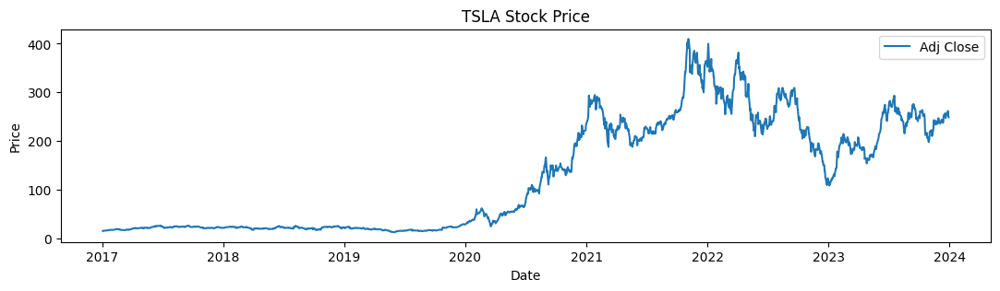

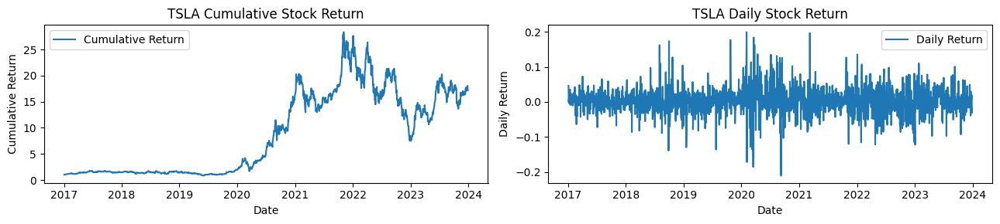

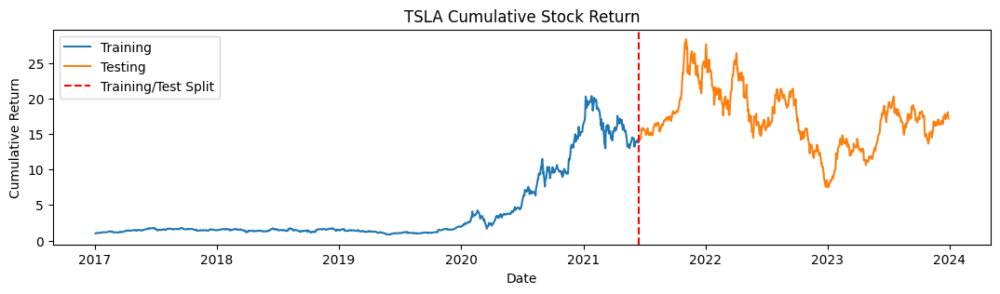

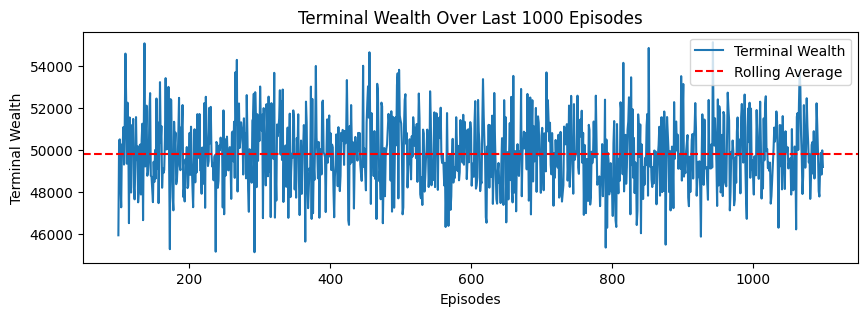

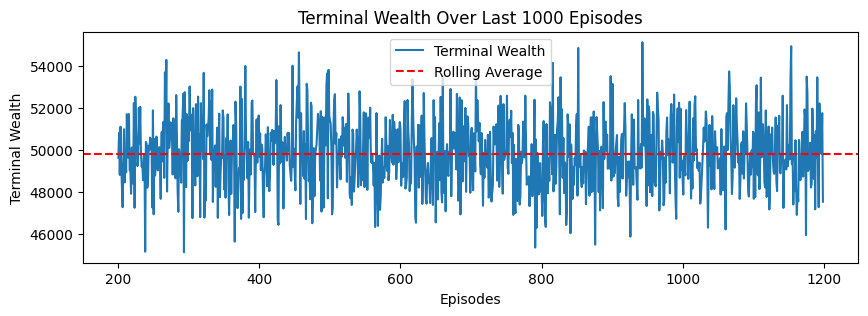

...

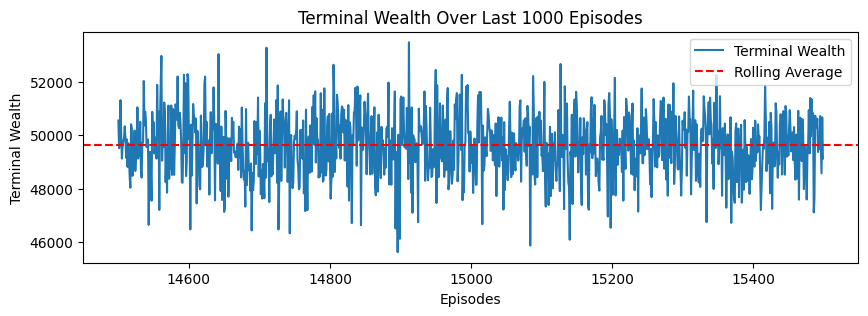

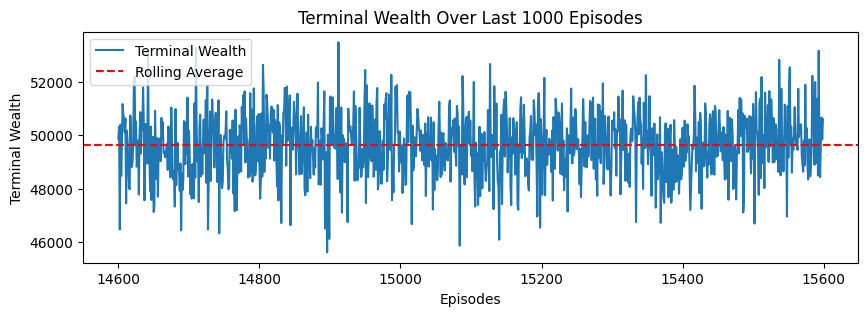

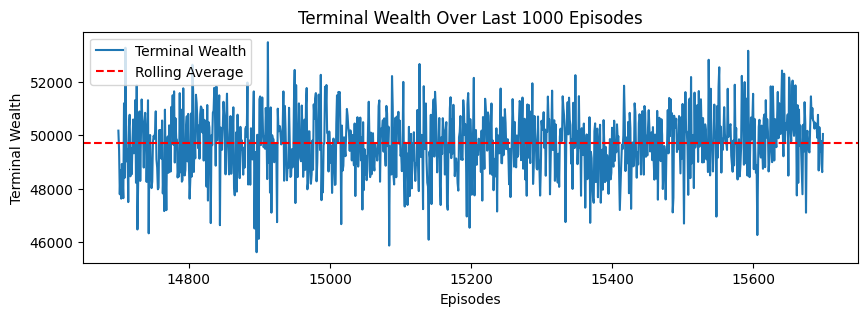

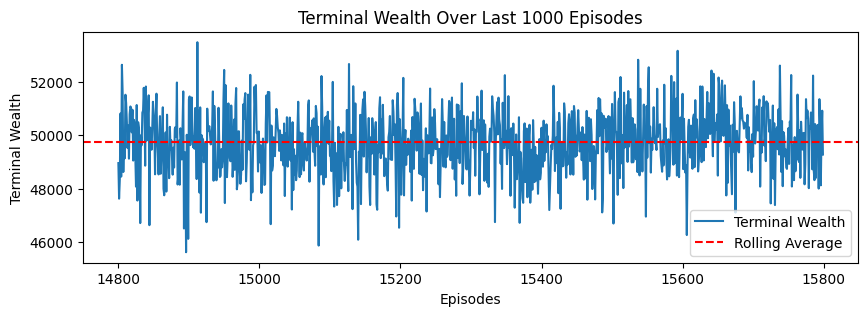

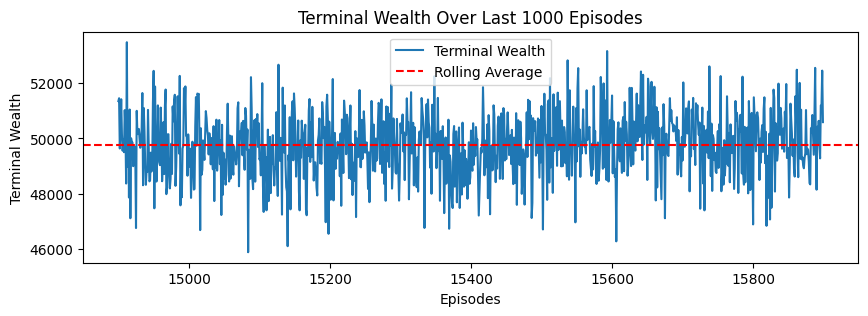

Terminal Wealth of Episode 15999: 49272.35


In [16]:
def main():
    """
    Main function to execute the investment strategy workflow.
    """
    # Set random seed for reproducibility
    seed(SEED_VALUE)

    # Fetch historical data
    try:
        PData = fetch_historical_data(TICKER, START_DATE, END_DATE)
    except ValueError as e:
        print(e)
        return

    # Check if data has enough entries
    if PData.shape[0] < TTRAIN:
        print(f"Insufficient data for training. Required: {TTRAIN}, Available: {PData.shape[0]}")
        return

    # Extract adjusted close prices and convert to NumPy array
    YDatapd = PData[["Adj Close"]]
    YData = YDatapd.to_numpy().flatten()  # Flatten to 1D array

    # Calculate daily returns
    RData = calculate_daily_returns(YData)

    # Convert date index to datetime
    YData_dates = pd.to_datetime(PData.index)

    # Display first few rows of the data
    print("Historical Data Snapshot:")
    print(PData.head())

    # Prepare state grids based on the data
    global PGRID, CGRID  # Declare as global to be accessible in training function
    PGRID, CGRID = prepare_grids(YData, INIT_CASH, MIN_WEALTH, MAX_WEALTH, N)

    # Plot stock price over time
    plot_stock_price(YData_dates, YData, TICKER)

    # Plot cumulative and daily returns
    plot_cumulative_and_daily_returns(YData_dates, YData, RData, TICKER)

    # Plot training vs testing periods
    plot_training_vs_testing(YData_dates, YData, TTRAIN, TICKER)

    # Define parameters for training
    params = {
        'INIT_CASH': INIT_CASH,
        'MIN_WEALTH': MIN_WEALTH,
        'MAX_WEALTH': MAX_WEALTH,
        'PENALTY': PENALTY,
        'COST': COST,
        'GAMMA': GAMMA,
        'SIGMA': SIGMA,
        'ALPHA': ALPHA,
        'ACTIONS_COUNT': ACTIONS_COUNT,
        'EPISODES': EPISODES,
        'EPISODE_SPLIT': EPISODE_SPLIT,
        'EPSILON_M': EPSILON_M,
        'TTRAIN': TTRAIN,
        'WINDOW': WINDOW
    }

    # Train the Q-learning agent
    qvalue, policy, terminal_wealth = train_q_learning_agent(YData, YData_dates, PGRID, CGRID, AGRID, params)

    # Print terminal wealth of the last episode
    if len(terminal_wealth) > 0:
        print(f"Terminal Wealth of Episode {EPISODES - 1}: {terminal_wealth[EPISODES - 1]:.2f}")
    else:
        print("No terminal wealth data available.")

if __name__ == "__main__":
    main()